<div style="background-color:#c3faf6; color:#222222; border:3px solid #bee5eb; padding:12px 14px; border-radius:10px; margin:10px 0;">

# How Facial Recognition Bias Compounds Across Race and Gender as Subjects Age


**CS109b Group #103**:Jenni Arakaki, Laine Roper, Arian Nzioka
**Project #18**: 

Project Proposal: https://drive.google.com/file/d/1yRPxpvg4jQc8gwzPgP_ptiSU6Qs4qmL1/view

# Problem Statement

We've started this project is to train and optimize a visual model to correct facial recognition bias across age, race and gender. 

The motivation is that facial features vary across race and gender as subjects age. A naive model will fail to capture these nuances, our model corrects fot this bais in facial change with aging while tracking them across race and gender.  

**To investigate whether bais that appears modest or acceptable at younger ages becomes more pronounced and unequally distributes at older ages, while tracking race and gender complexity.**


In [2]:
# Standard library
import os
import gc
import time
import warnings

# Numerical computing and data processing
import numpy as np
import pandas as pd
import random
from pathlib import Path
from collections import Counter
import zipfile

# external utilities
import kagglehub
import hashlib

# Visualization
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import seaborn as sns

# Scikit-learn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset

from torchvision import datasets, models, transforms
from torchvision.models import ResNet50_Weights

# UMAP
#import umap
from tqdm import tqdm
from umap import UMAP

In [3]:
# Suppress warnings
warnings.filterwarnings('ignore')

### Downloading/Accessing data:
1) Download data from https://www.kaggle.com/datasets/jangedoo/utkface-new.
2) kagglehub library downloads and stores data in `./cache` directory for reproducibility

In [65]:
# change paths as needed
class FlatImageDataset(Dataset):
    def __init__(self, img_dir, transform=None):
        self.img_dir = Path(img_dir)
        self.files = [f for f in self.img_dir.rglob("*")
                      if f.name.endswith(".jpg")       
                      or f.name.endswith(".jpeg")
                      or f.name.endswith(".png")]
        self.transform = transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, self.files[idx].name   


path = kagglehub.dataset_download("jangedoo/utkface-new")
utk_path = next(Path(path).rglob("UTKFace"))

dataset = FlatImageDataset(utk_path / "UTKFace")

size = 0
img_count = 0
for dirpath, dirnames, filenames in os.walk(utk_path):
    for f in filenames:
        fp = os.path.join(dirpath, f)
        size += os.path.getsize(fp)
        img_count += 1

print("Dataset downloaded to:", utk_path)

print(f"Number of images : {img_count}")
print(f"Size on disk   : {size / (1024**2):.2f} MB")

Dataset downloaded to: C:\Users\arian\.cache\kagglehub\datasets\jangedoo\utkface-new\versions\1\UTKFace
Number of images : 23708
Size on disk   : 114.43 MB


## Datawrangling, EDA, Visualizations

### Labels:

The labels of each face image is embedded in the file name, formated like [age]_[gender]_[race]_[date&time].jpg

- `age` is an integer from `0`to `116`, indicating the age
- `gender` is either 0 `male` or 1 `female`
- `race` is an integer from 0 to 4, denoting `White`, `Black`, `Asian`, `Indian`, and `Others` (like `Hispanic`, `Latino`, `Middle Eastern`).
- `date&time` is in the format of `yyyymmddHHMMSSFFF`, showing the date and time an image was collected to UTKFace

**DataFrame from Dataset**

In [71]:
records = []
for fpath in dataset.files:       
    filename = fpath.name
    parts    = filename.split("_")
    if len(parts) < 4:
        continue
    try:
        age    = int(parts[0])
        gender = int(parts[1])
        race   = int(parts[2])
    except ValueError:
        print(f'Error with {filename}')
        continue
    with Image.open(fpath) as im:
        img = im.convert('RGB').copy()
    records.append({
        'age'     : age,
        'gender'  : gender,
        'race'    : race,
        'image'   : img,
        'filename': filename,
    })

df = pd.DataFrame(records)
print(f"\nDataFrame shape: {df.shape}")
display(df.head())

print("utk_path:", utk_path)
print("Exists  :", utk_path.exists())
print(f"Files found: {len(dataset.files):,}")
print(f"Sample filename: {dataset.files[0].name}")


DataFrame shape: (23705, 5)


,age,gender,race,image,filename
0,100,0,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_0_0_20170112213500903.jpg.chip.jpg
1,100,0,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_0_0_20170112215240346.jpg.chip.jpg
2,100,1,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_0_20170110183726390.jpg.chip.jpg
3,100,1,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_0_20170112213001988.jpg.chip.jpg
4,100,1,0,<PIL.Image.Image image mode=RGB size=200x200 a...,100_1_0_20170112213303693.jpg.chip.jpg


utk_path: C:\Users\arian\.cache\kagglehub\datasets\jangedoo\utkface-new\versions\1\UTKFace
Exists  : True
Files found: 23,708
Sample filename: 100_0_0_20170112213500903.jpg.chip.jpg


### Visualizing data:

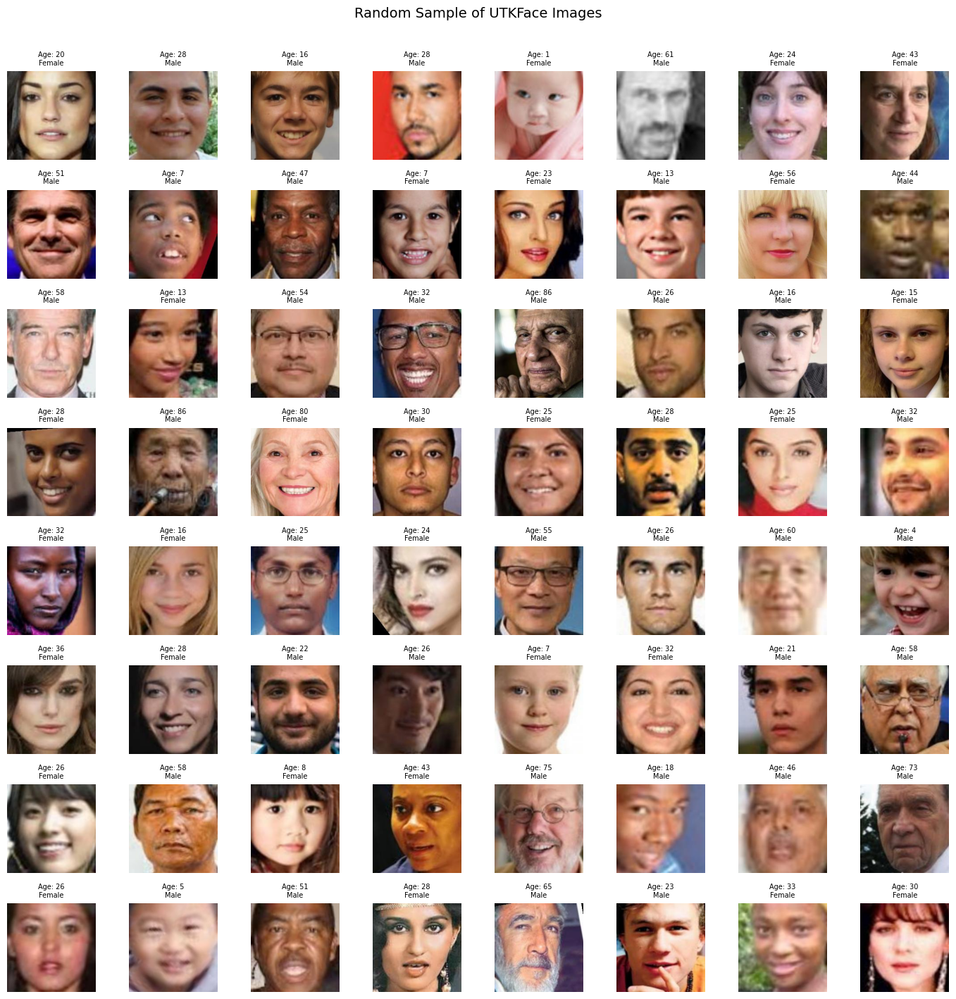

In [72]:
img_path = Path(f'{path}')

dataset = datasets.ImageFolder( img_path )

SEED = 1090
sample_df = df.sample(64, random_state=SEED).reset_index(drop=True)

fig, axes = plt.subplots(8, 8, figsize=(14, 14))
axes = axes.ravel()

for i, row in sample_df.iterrows():
    ax = axes[i]
    ax.imshow(row['image'])
    ax.set_title(f"Age: {row['age']}\n{['Male','Female'][row['gender']]}", fontsize=7)
    ax.axis('off')

plt.suptitle('Random Sample of UTKFace Images', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

### Search for Duplicate Images

In [73]:
def hash_image(img):
    """Generate MD5 hash from image pixels."""
    return hashlib.md5(np.array(img).tobytes()).hexdigest()

print("Hashing images...")
df['hash'] = [hash_image(img) for img in df['image']]

n_before = len(df)
duplicates = df[df.duplicated(subset='hash', keep=False)]
print(f"Total duplicate images (including originals): {len(duplicates)}")
print(f"Unique duplicate hashes: {df['hash'].duplicated().sum()}")

Hashing images...
Total duplicate images (including originals): 765
Unique duplicate hashes: 390


Unique duplicate groups: 375


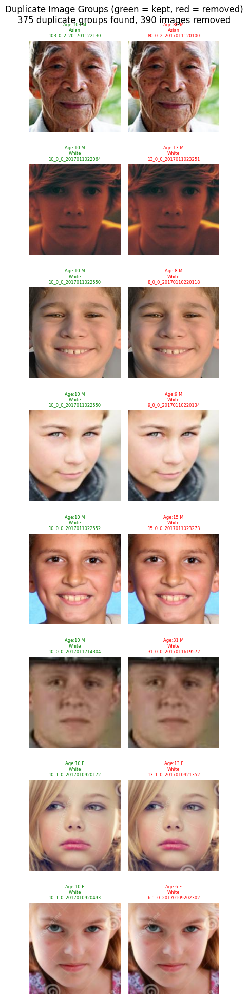

In [74]:
duplicate_hashes = df[df.duplicated(subset='hash', keep=False)]['hash'].unique()
print(f"Unique duplicate groups: {len(duplicate_hashes)}")

N_GROUPS = 8
selected_hashes = duplicate_hashes[:N_GROUPS]

dup_rows = []
for h in selected_hashes:
    group = df[df['hash'] == h]
    dup_rows.append(group)

max_group_size = max(len(g) for g in dup_rows)

fig, axes = plt.subplots(N_GROUPS, max_group_size, figsize=(max_group_size * 2, N_GROUPS * 2.5))

for row_i, group in enumerate(dup_rows):
    for col_i in range(max_group_size):
        ax = axes[row_i, col_i]
        if col_i < len(group):
            r = group.iloc[col_i]
            ax.imshow(r['image'])
            ax.set_title(
                f"Age:{r['age']} {'M' if r['gender']==0 else 'F'}\n"
                f"{['White','Black','Asian','Indian','Others'][r['race']]}\n"
                f"{r['filename'][:20]}",
                fontsize=6,
                color='red' if col_i > 0 else 'green' 
            )
        ax.axis('off')

    axes[row_i, 0].set_ylabel(f"Group {row_i+1}", fontsize=8, rotation=90)

plt.suptitle(
    f"Duplicate Image Groups (green = kept, red = removed)\n"
    f"{len(duplicate_hashes)} duplicate groups found, "
    f"{df['hash'].duplicated().sum()} images removed",
    fontsize=12
)
plt.tight_layout()
plt.show()

In [75]:
df = df.drop_duplicates(subset='hash', keep='first').reset_index(drop=True)
n_after = len(df)

print(f"\nBefore : {n_before:,} images")
print(f"After  : {n_after:,} images")
print(f"Removed: {n_before - n_after:,} duplicates")


Before : 23,705 images
After  : 23,315 images
Removed: 390 duplicates


In [76]:
class DFDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df        = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row    = self.df.iloc[idx]
        img    = row['image']
        age    = row['age']
        gender = row['gender']
        race   = row['race']

        if self.transform:
            img = self.transform(img)

        return img, age, gender, race

transform = transforms.Compose([
    transforms.ToTensor(),
])

clean_dataset = DFDataset(df, transform=transform)

print(f"Clean dataset size: {len(clean_dataset):,} images")
print(f"Sample: {clean_dataset[0][0].shape}, age={clean_dataset[0][1]}, gender={clean_dataset[0][2]}, race={clean_dataset[0][3]}")

Clean dataset size: 23,315 images
Sample: torch.Size([3, 200, 200]), age=100, gender=0, race=0


## Preliminary EDA

### Defining a dataframe with demographics

Age range: 1 – 116
Total images: 23,315


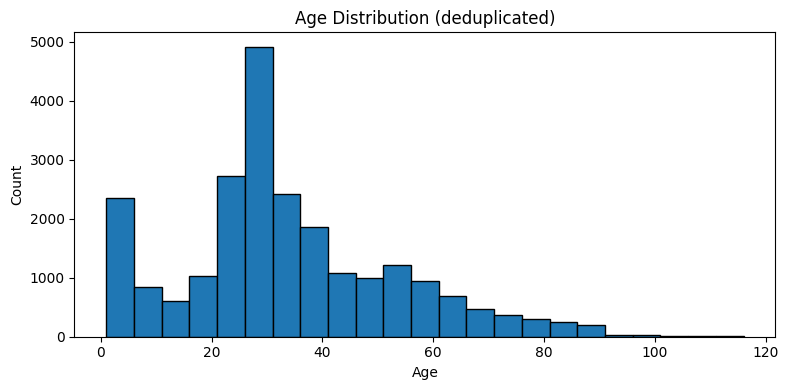

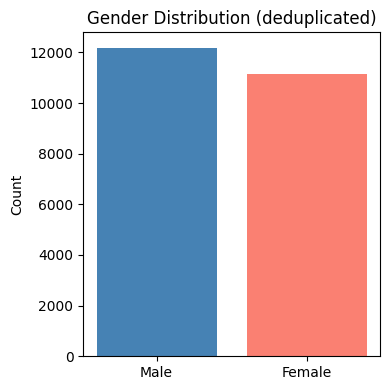

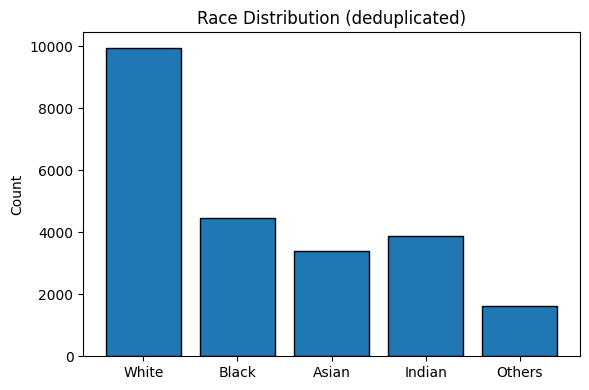

In [77]:
ages    = df['age'].tolist()
genders = df['gender'].tolist()
races   = df['race'].tolist()

age_max = df['age'].max()
age_min = df['age'].min()

print(f"Age range: {age_min} – {age_max}")
print(f"Total images: {len(df):,}")

# Age distribution
plt.figure(figsize=(8, 4))
plt.hist(ages, bins=range(age_min, age_max + 1, 5), edgecolor='black')
plt.title("Age Distribution (deduplicated)")
plt.xlabel("Age")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

# Gender distribution
gender_counts = Counter(genders)
plt.figure(figsize=(4, 4))
plt.bar(['Male', 'Female'],
        [gender_counts.get(0, 0), gender_counts.get(1, 0)],
        color=['steelblue', 'salmon'])
plt.title("Gender Distribution (deduplicated)")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

# Race distribution
race_labels_map = {0: 'White', 1: 'Black', 2: 'Asian', 3: 'Indian', 4: 'Others'}
race_counts     = Counter(races)
plt.figure(figsize=(6, 4))
plt.bar([race_labels_map[i] for i in range(5)],
        [race_counts.get(i, 0) for i in range(5)],
        edgecolor='black')
plt.title("Race Distribution (deduplicated)")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

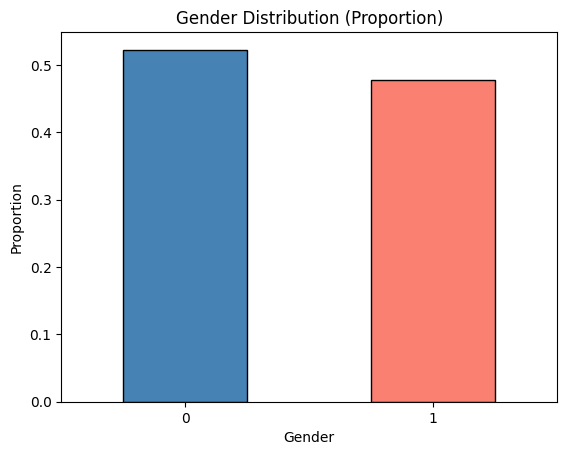

gender
0    0.522625
1    0.477375
Name: proportion, dtype: float64


<Axes: xlabel='gender', ylabel='age'>

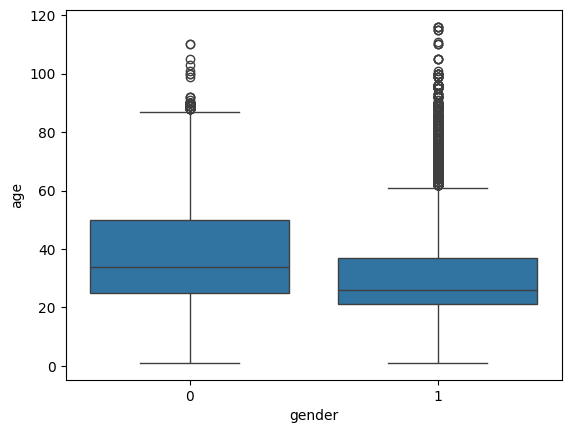

In [78]:
gender_dist = df["gender"].value_counts(normalize=True)

plt.figure()
gender_dist.plot(kind="bar", edgecolor='black', color=['steelblue', 'salmon'])
plt.title("Gender Distribution (Proportion)")
plt.xlabel("Gender")
plt.ylabel("Proportion")
plt.xticks(rotation=0)
plt.show()

print(df["gender"].value_counts(normalize=True))

sns.boxplot(x="gender", y="age", data=df)

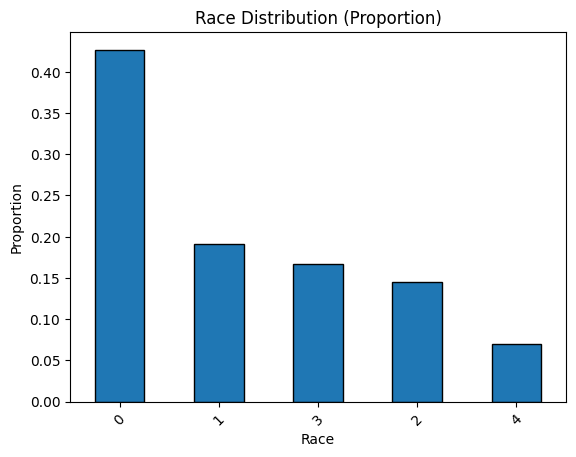

race
0    0.426935
1    0.190821
3    0.166717
2    0.145271
4    0.070255
Name: proportion, dtype: float64


In [79]:
race_dist = df["race"].value_counts(normalize=True)

plt.figure()
race_dist.plot(kind="bar", edgecolor='black')
plt.title("Race Distribution (Proportion)")
plt.xlabel("Race")
plt.ylabel("Proportion")
plt.xticks(rotation=45)
plt.show()

print(df["race"].value_counts(normalize=True))

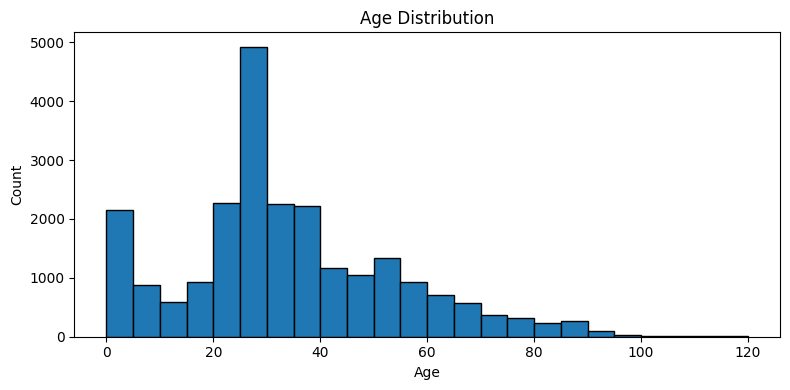

In [80]:
plt.figure(figsize=(8, 4))
plt.hist(df["age"], bins=range(0, 121, 5), edgecolor='black')  # 0-120 in steps of 5 years
plt.title("Age Distribution")
plt.xlabel("Age")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [81]:
df["age_group"] = pd.cut(
    df["age"],
    bins=[0, 12, 19, 35, 60, 120],
    labels=["child", "teen", "young_adult", "adult", "older_adult"],
    right=False
)

print(df["age_group"].value_counts())

age_group
young_adult    9552
adult          6684
child          3254
older_adult    2633
teen           1192
Name: count, dtype: int64


Text(0.5, 1.0, 'Age by Race')

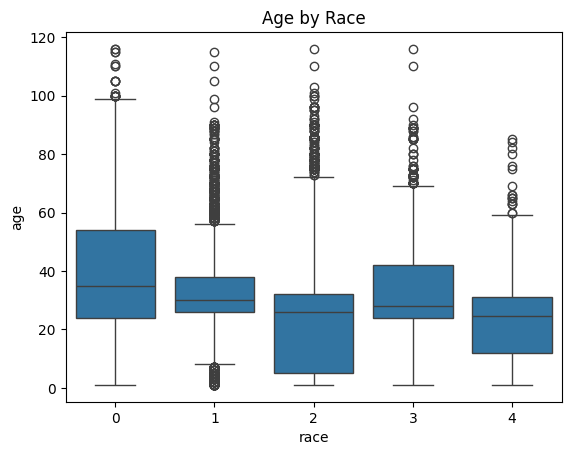

In [82]:
sns.boxplot(x="race", y="age", data=df)
plt.title("Age by Race")

Text(0.5, 1.0, 'Gender by Race')

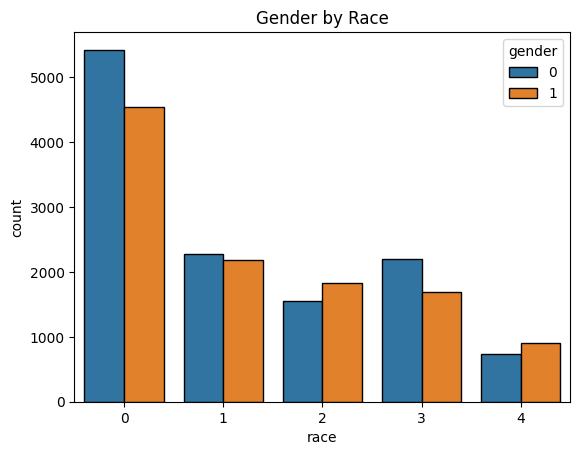

In [83]:
sns.countplot(x="race", hue="gender", data=df, edgecolor='black')
plt.title("Gender by Race")

### Key EDA Takeaways

#### 1. Gender distribution is relatively balanced
The dataset contains ~52% male and ~48% female samples

This indicates minimal gender imbalance overall

However, this balance does not guarantee fairness across subgroups (e.g., within each race or age group)

#### 2. Significant racial imbalance exists
White faces dominate (~42.5%)

Other groups are underrepresented:

- Black: ~19%
- Indian: ~16.8%
- Asian: ~14.5%
- Others: ~7.1%

#### 3. Age distribution is skewed (non-uniform)
Strong concentration in young adults (20–35)

Noticeable spike in very young ages (children/babies)

Teens are underrepresented

Gradual decline in samples for older ages

#### 4. Age distribution differs across gender
Males have a higher median age than females

Male age distribution is shifted older overall

Females are more concentrated in younger ranges

#### 5. Age distribution differs across race (important)
White group appears to have:

- higher median age
- wider spread

Other groups (e.g., Asian, Others) skew younger
Some races have fewer older individuals

#### 6. Gender imbalance varies across races
Some races (e.g., Indian) have more males than females

Others are more balanced

“Others” category is small and uneven

## Unsupervised Learning Methods

### PCA

In [84]:
age_bins = pd.cut(df['age'], bins=[0, 18, 35, 50, 65, 120], labels=[0, 1, 2, 3, 4])
stratify_key = age_bins.astype(str) + '_' + df['gender'].astype(str) + '_' + df['race'].astype(str)

# Split indices
eda_idx, holdout_idx = train_test_split(
    np.arange(len(df)),
    test_size=0.76,
    train_size=0.24,
    random_state=1090,
    stratify=stratify_key
)

eda_df      = df.iloc[eda_idx].reset_index(drop=True)
holdout_df  = df.iloc[holdout_idx].reset_index(drop=True)

print(f"EDA set     : {len(eda_df):,} images")
print(f"Holdout set : {len(holdout_df):,} images")

# Verify stratification
print("\nGender distribution (EDA):")
print(eda_df['gender'].value_counts(normalize=True).round(3))

print("\nGender distribution (Holdout):")
print(holdout_df['gender'].value_counts(normalize=True).round(3))

EDA set     : 5,595 images
Holdout set : 17,720 images

Gender distribution (EDA):
gender
0    0.523
1    0.477
Name: proportion, dtype: float64

Gender distribution (Holdout):
gender
0    0.523
1    0.477
Name: proportion, dtype: float64


Vectors shape: (5595, 12288)
Memory usage : 275.0 MB


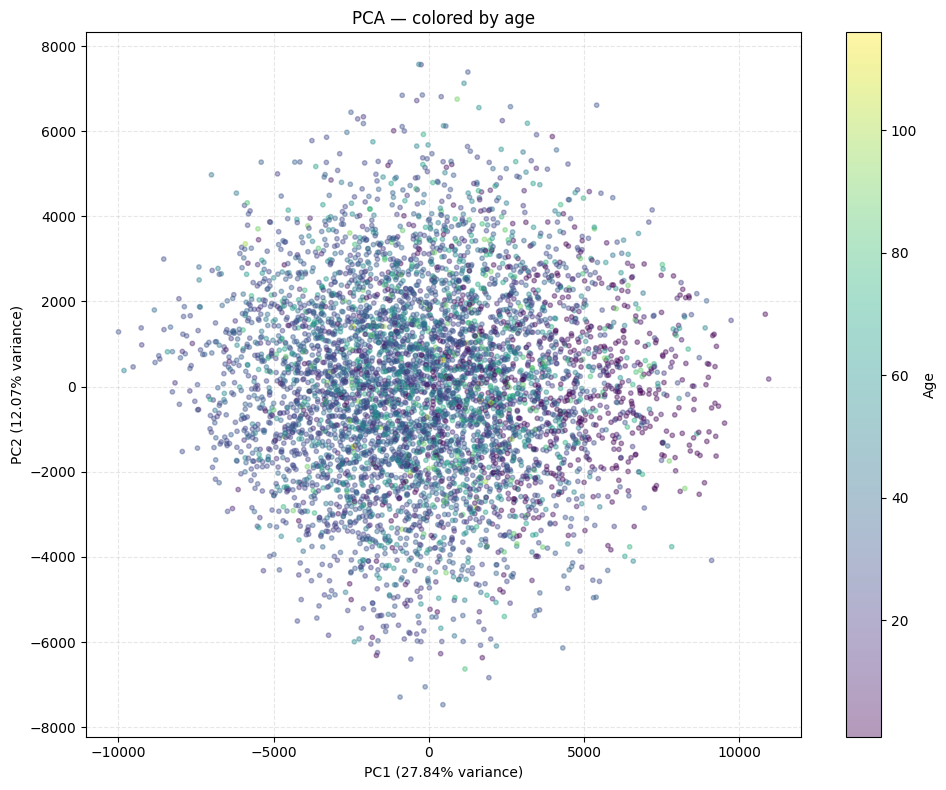

Variance Explained by PC1: 27.84%
Variance Explained by PC2: 12.07%


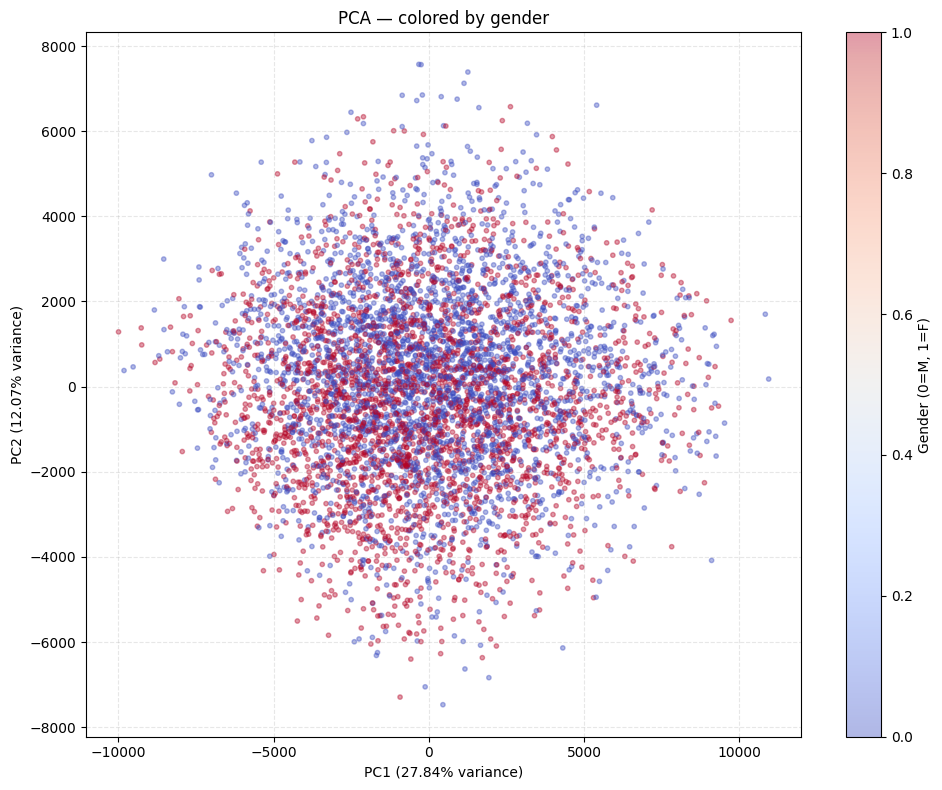

Variance Explained by PC1: 27.84%
Variance Explained by PC2: 12.07%


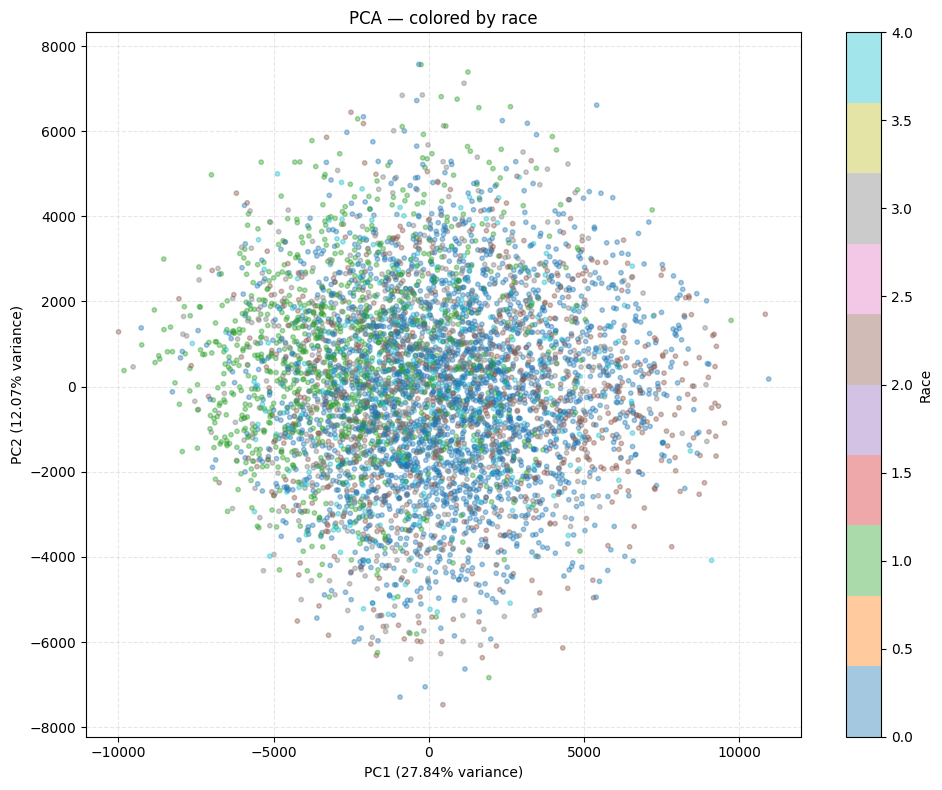

Variance Explained by PC1: 27.84%
Variance Explained by PC2: 12.07%


In [39]:
i_sz = (64, 64)

vectors = np.array([
    np.array(row['image'].resize(i_sz)).flatten()
    for _, row in eda_df.iterrows()
], dtype=np.float32)

print(f"Vectors shape: {vectors.shape}")
print(f"Memory usage : {vectors.nbytes / 1e6:.1f} MB")

pca = PCA(n_components=2)
pca.fit(vectors)
vectors_pca = pca.transform(vectors)

def plot_pca(vectors_pca, df, color_by='age'):
    fig, ax = plt.subplots(figsize=(10, 8))

    if color_by == 'age':
        c      = df['age']
        label  = 'Age'
        cmap   = 'viridis'
    elif color_by == 'gender':
        c      = df['gender']
        label  = 'Gender (0=M, 1=F)'
        cmap   = 'coolwarm'
    elif color_by == 'race':
        c      = df['race']
        label  = 'Race'
        cmap   = 'tab10'

    sc = ax.scatter(vectors_pca[:, 0], vectors_pca[:, 1],
                    c=c, cmap=cmap, alpha=0.4, s=10)
    plt.colorbar(sc, ax=ax, label=label)
    ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)")
    ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)")
    ax.set_title(f"PCA — colored by {color_by}")
    ax.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"Variance Explained by PC1: {pca.explained_variance_ratio_[0]:.2%}")
    print(f"Variance Explained by PC2: {pca.explained_variance_ratio_[1]:.2%}")

plot_pca(vectors_pca, eda_df, color_by='age')
plot_pca(vectors_pca, eda_df, color_by='gender')
plot_pca(vectors_pca, eda_df, color_by='race')

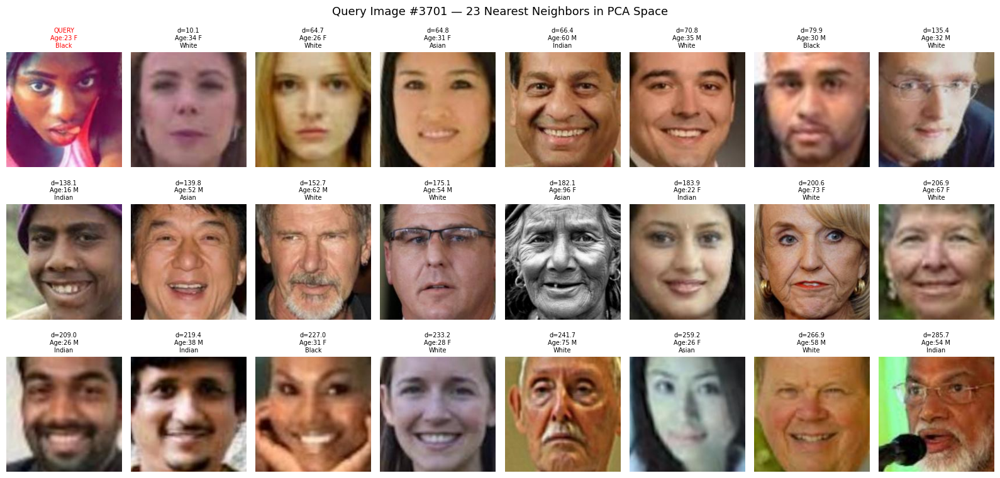

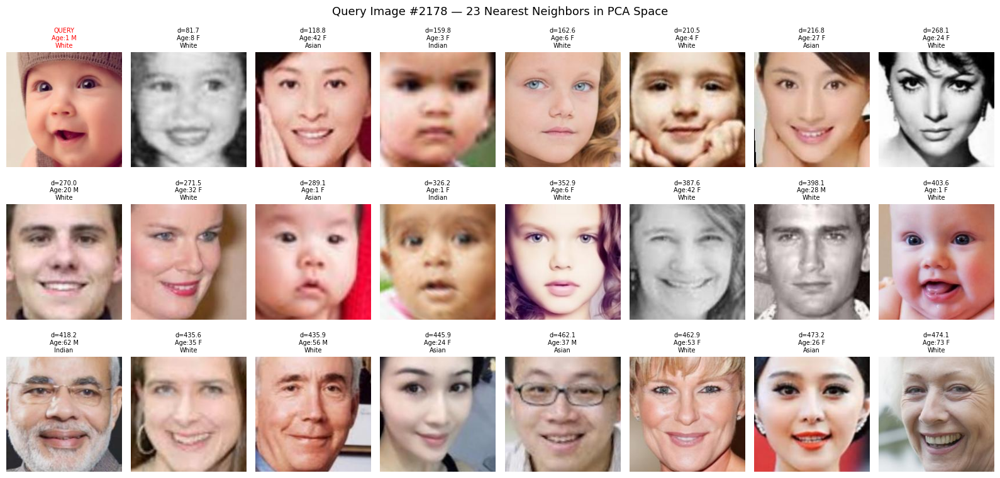

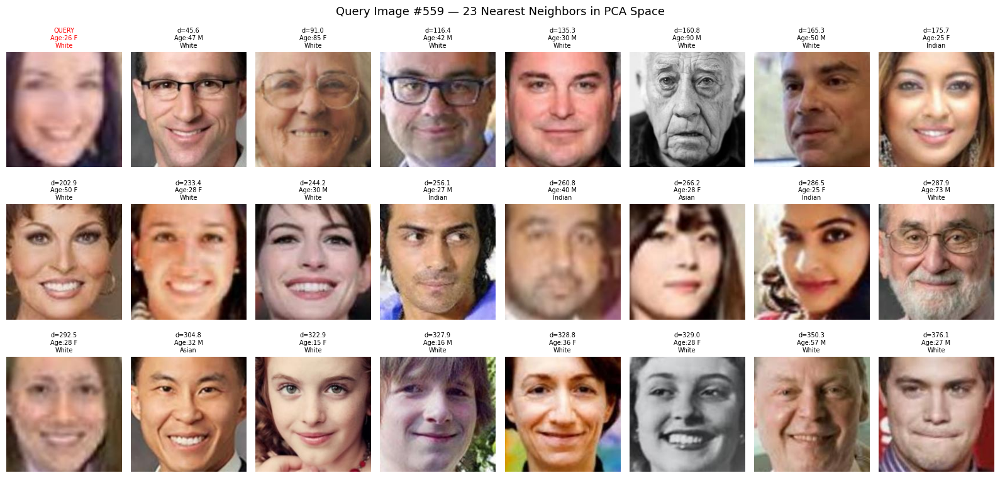

In [40]:
def sample_img_plt(vectors, df, size):
    knn = NearestNeighbors(n_neighbors=24, metric='euclidean')
    knn.fit(vectors)
    
    np.random.seed(1090)
    sample_indices = np.random.choice(len(vectors), size=size, replace=False)
    
    for idx in sample_indices:
        sample = vectors[idx].reshape(1, -1)
        distances, neighbor_indices = knn.kneighbors(sample)
        all_indices = neighbor_indices[0]

        fig, axes = plt.subplots(3, 8, figsize=(16, 8))
        axes = axes.ravel()

        for plot_i, dataset_idx in enumerate(all_indices):
            row = df.iloc[dataset_idx]
            axes[plot_i].imshow(row['image'])

            gender = 'M' if row['gender'] == 0 else 'F'
            race_map = {0: 'White', 1: 'Black', 2: 'Asian', 3: 'Indian', 4: 'Others'}

            if plot_i == 0:
                axes[plot_i].set_title(
                    f"QUERY\nAge:{row['age']} {gender}\n{race_map[row['race']]}",
                    fontsize=7, color='red'
                )
            else:
                axes[plot_i].set_title(
                    f"d={distances[0][plot_i]:.1f}\nAge:{row['age']} {gender}\n{race_map[row['race']]}",
                    fontsize=7
                )
            axes[plot_i].axis('off')

        plt.suptitle(f"Query Image #{idx} — 23 Nearest Neighbors in PCA Space", fontsize=13)
        plt.tight_layout()
        plt.show()

sample_img_plt(vectors_pca, eda_df, size=3)

### UMAP + KMEANS using PCA embbeddings

Total UMAP fits: 48 | Total KMeans fits: 288

Top 15 Configurations by Silhouette Score:


,n_neighbors,min_dist,n_components,k,silhouette_score
0,150,0.1,2,5,0.416575
1,100,0.1,2,5,0.416126
2,150,0.1,2,10,0.409515
3,150,0.1,15,5,0.409270
4,150,0.1,50,5,0.408499
5,50,0.1,2,5,0.408425
6,15,0.1,2,9,0.408366
7,100,0.1,2,10,0.406430
8,150,0.2,2,5,0.405913
9,150,0.1,2,6,0.405795


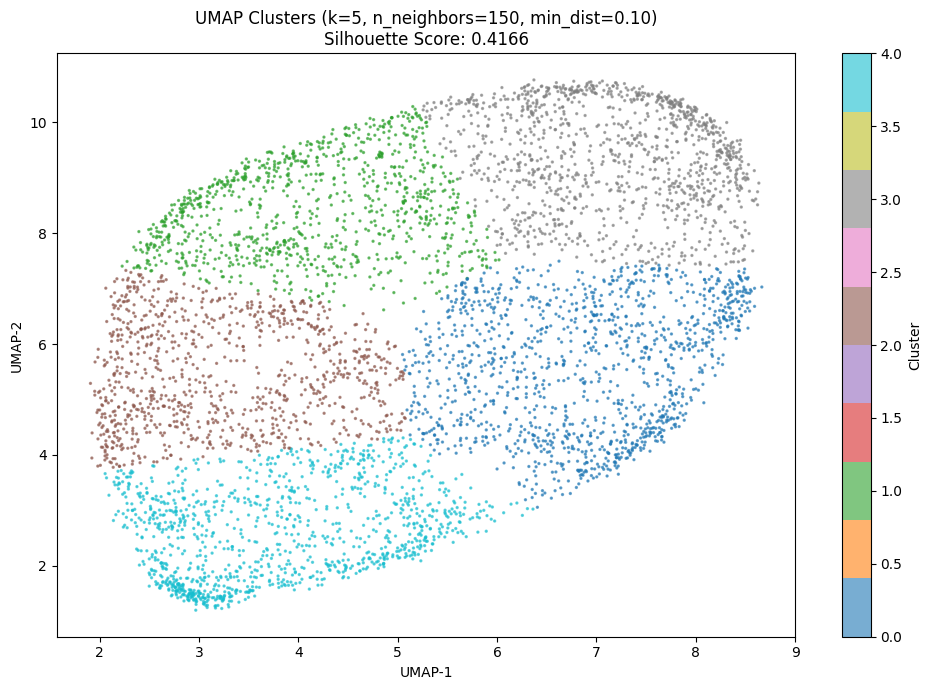

In [42]:
KMEANS_N_INIT = 10
N_NEIGHBORS   = [15, 50, 100, 150]
MIN_DIST      = [0.1, 0.2, 0.5, 0.99]
N_COMPONENTS  = [2, 15, 50]
K_VALUES      = [5, 6, 7, 8, 9, 10]
RANDOM_STATE  = 1090

total = len(N_NEIGHBORS) * len(MIN_DIST) * len(N_COMPONENTS)
print(f"Total UMAP fits: {total} | Total KMeans fits: {total * len(K_VALUES)}")

results = []
for n_neighbors in N_NEIGHBORS:
    for min_dist in MIN_DIST:
        for n_components in N_COMPONENTS:
            umap_model = UMAP(
                n_components=n_components,
                n_neighbors=n_neighbors,
                min_dist=min_dist,
                random_state=RANDOM_STATE
            )
            embedding = umap_model.fit_transform(vectors_pca)

            for k in K_VALUES:
                kmeans = KMeans(n_clusters=k, n_init=KMEANS_N_INIT, random_state=RANDOM_STATE)
                cluster_labels = kmeans.fit_predict(embedding)
                score = silhouette_score(embedding, cluster_labels)
                results.append({
                    "n_neighbors"     : n_neighbors,
                    "min_dist"        : min_dist,
                    "n_components"    : n_components,
                    "k"               : k,
                    "silhouette_score": score,
                    "embedding"       : embedding,       
                    "cluster_labels"  : cluster_labels,
                })

results_df = pd.DataFrame(results)
results_df = results_df.sort_values("silhouette_score", ascending=False).reset_index(drop=True)

print("\nTop 15 Configurations by Silhouette Score:")
display(results_df.drop(columns=["embedding", "cluster_labels"]).head(15))

best        = results_df.iloc[0]
best_embed  = best["embedding"]
best_labels = best["cluster_labels"]

if best["n_components"] == 2:
    fig, ax = plt.subplots(figsize=(10, 7))
    scatter = ax.scatter(
        best_embed[:, 0], best_embed[:, 1],
        c=best_labels,
        cmap='tab10',
        s=2,
        alpha=0.6
    )
    plt.colorbar(scatter, ax=ax, label='Cluster')
    ax.set_title(
        f"UMAP Clusters (k={int(best['k'])}, "
        f"n_neighbors={int(best['n_neighbors'])}, "
        f"min_dist={best['min_dist']:.2f})\n"
        f"Silhouette Score: {best['silhouette_score']:.4f}",
        fontsize=12
    )
    ax.set_xlabel("UMAP-1")
    ax.set_ylabel("UMAP-2")
    plt.tight_layout()
    plt.show()
else:
    
    print(f"Best config has n_components={int(best['n_components'])}, refitting with 2D for visualization...")
    umap_2d = UMAP(
        n_components=2,
        n_neighbors=int(best["n_neighbors"]),
        min_dist=best["min_dist"],
        random_state=RANDOM_STATE
    )
    embed_2d = umap_2d.fit_transform(vectors_pca)

    fig, ax = plt.subplots(figsize=(10, 7))
    scatter = ax.scatter(
        embed_2d[:, 0], embed_2d[:, 1],
        c=best_labels,
        cmap='tab10',
        s=2,
        alpha=0.6
    )
    
    plt.colorbar(scatter, ax=ax, label='Cluster')
    ax.set_title(
        f"UMAP 2D Projection — Best Config (k={int(best['k'])}, "
        f"n_neighbors={int(best['n_neighbors'])}, "
        f"min_dist={best['min_dist']:.2f})\n"
        f"Silhouette Score: {best['silhouette_score']:.4f}",
        fontsize=12
    )
    ax.set_xlabel("UMAP-1")
    ax.set_ylabel("UMAP-2")
    plt.tight_layout()
    plt.show()

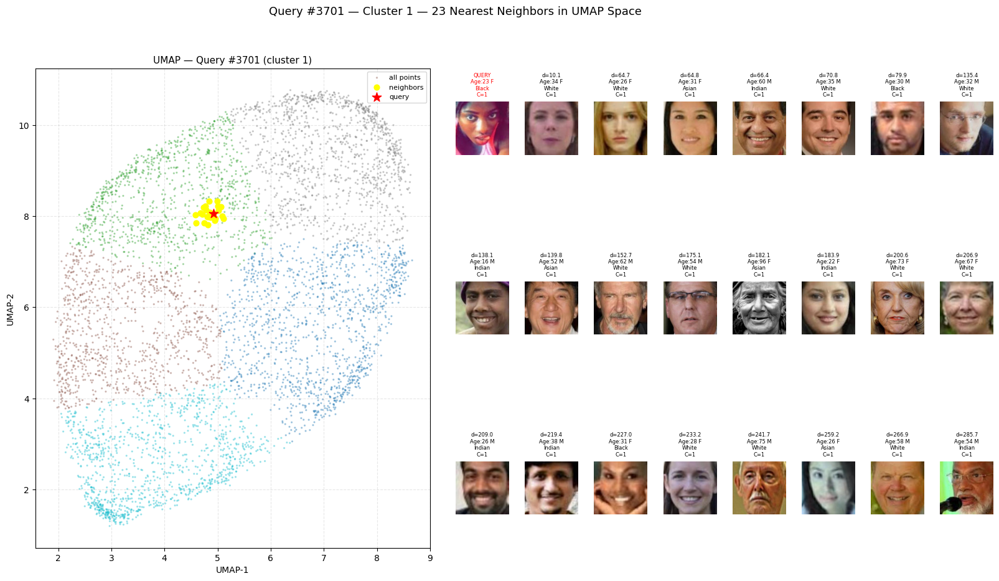

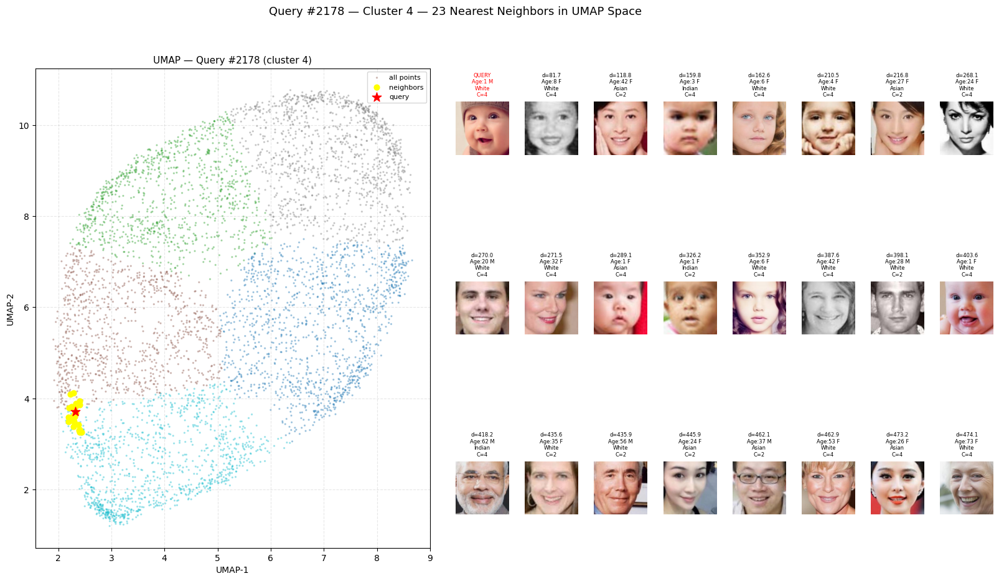

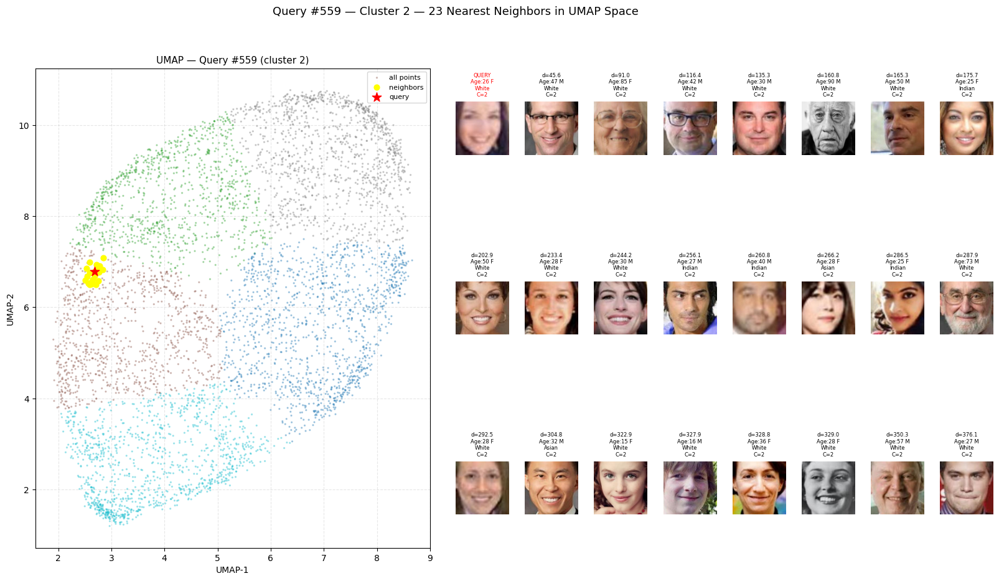

In [43]:
def sample_img_plt_umap(vectors, df, embedding_2d, cluster_labels, size=3):
    knn = NearestNeighbors(n_neighbors=24, metric='euclidean')
    knn.fit(vectors)

    race_map   = {0: 'White', 1: 'Black', 2: 'Asian', 3: 'Indian', 4: 'Others'}
    colors     = plt.cm.tab10(np.linspace(0, 1, len(np.unique(cluster_labels))))

    np.random.seed(1090)
    sample_indices = np.random.choice(len(vectors), size=size, replace=False)

    for idx in sample_indices:
        sample = vectors[idx].reshape(1, -1)
        distances, neighbor_indices = knn.kneighbors(sample)
        all_indices = neighbor_indices[0]

        fig = plt.figure(figsize=(18, 10))

        ax_umap = fig.add_subplot(1, 2, 1)
        ax_umap.scatter(
            embedding_2d[:, 0], embedding_2d[:, 1],
            c=cluster_labels, cmap='tab10',
            s=2, alpha=0.3, label='all points'
        )
        
        ax_umap.scatter(
            embedding_2d[all_indices, 0], embedding_2d[all_indices, 1],
            s=40, color='yellow', zorder=3, label='neighbors'
        )

        ax_umap.scatter(
            embedding_2d[idx, 0], embedding_2d[idx, 1],
            s=120, color='red', zorder=4, marker='*', label='query'
        )
        ax_umap.set_title(f"UMAP — Query #{idx} (cluster {cluster_labels[idx]})", fontsize=11)
        ax_umap.set_xlabel("UMAP-1")
        ax_umap.set_ylabel("UMAP-2")
        ax_umap.legend(fontsize=8)
        ax_umap.grid(True, linestyle='--', alpha=0.3)

        inner_grid = fig.add_subplot(1, 2, 2)
        inner_grid.axis('off')

        sub_axes = fig.add_gridspec(3, 8, left=0.5, right=0.98, hspace=0.5, wspace=0.3)

        for plot_i, dataset_idx in enumerate(all_indices):
            row    = df.iloc[dataset_idx]
            gender = 'M' if row['gender'] == 0 else 'F'
            ax_img = fig.add_subplot(sub_axes[plot_i // 8, plot_i % 8])
            ax_img.imshow(row['image'])
            cluster_color = colors[cluster_labels[dataset_idx]]

            if plot_i == 0:
                ax_img.set_title(
                    f"QUERY\nAge:{row['age']} {gender}\n{race_map[row['race']]}\nC={cluster_labels[dataset_idx]}",
                    fontsize=6, color='red'
                )
                for spine in ax_img.spines.values():
                    spine.set_edgecolor('red')
                    spine.set_linewidth(2)
            else:
                ax_img.set_title(
                    f"d={distances[0][plot_i]:.1f}\nAge:{row['age']} {gender}\n{race_map[row['race']]}\nC={cluster_labels[dataset_idx]}",
                    fontsize=6
                )
                for spine in ax_img.spines.values():
                    spine.set_edgecolor(cluster_color)
                    spine.set_linewidth(2)
            ax_img.axis('off')

        plt.suptitle(
            f"Query #{idx} — Cluster {cluster_labels[idx]} — 23 Nearest Neighbors in UMAP Space",
            fontsize=13
        )
        plt.show()


best          = results_df.iloc[0]
best_labels   = best['cluster_labels']

if best['n_components'] == 2:
    best_embed_2d = best['embedding']
else:
    umap_2d = UMAP(
        n_components=2,
        n_neighbors=int(best['n_neighbors']),
        min_dist=best['min_dist'],
        random_state=1090
    )
    best_embed_2d = umap_2d.fit_transform(vectors_pca)

sample_img_plt_umap(vectors_pca, eda_df, best_embed_2d, best_labels, size=3)

## Initial ResNet Training

### Train val test split

Stratifying the split to allow for subgroup fairness (addressing the issues seen in EDA).

Because some fine-grained age × race × gender subgroups contained too few samples for reliable stratified splitting, we stratified by race and gender only, while reserving age bins for downstream fairness evaluation.

Ages are binned to specifically look at the effect of fewer images of teens.

In [59]:
labels = ["0_5",      # infants / toddlers
          "5_13",     # children
          "13_20",    # teens
          "21_40",
          "41_60",
          "61_80",
          "80_plus"
]

df["eval_age_bin"] = pd.cut(
    df["age"],
    bins = [0, 5, 13, 20, 40, 60, 80, 120],
    labels = labels,
    include_lowest=True
)

# simple stratification key
df["stratify_key"] = (
    df["race_label"].astype(str) + "_" +
    df["gender_label"].astype(str) + "_"
)

# remove very tiny groups if stratification breaks
valid_keys = df["stratify_key"].value_counts()
valid_keys = valid_keys[valid_keys >= 2].index
df_split = df[df["stratify_key"].isin(valid_keys)].copy()

train_df, temp_df = train_test_split(
    df_split,
    test_size=0.30,
    random_state=42,
    stratify=df_split["stratify_key"]
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,
    random_state=42,
    stratify=temp_df["stratify_key"]
)

print(f"Train size: {len(train_df)}")
print(f"Validation size: {len(val_df)}")
print(f"Test size: {len(test_df)}")

Train size: 16593
Validation size: 3556
Test size: 3556


### First Pass ResNet CNN

In [70]:
class UTKFaceDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        image = Image.open(row["filepath"]).convert("RGB")

        if self.transform:
            image = self.transform(image)

        age = torch.tensor(row["age"], dtype=torch.float32)
        gender = torch.tensor(row["gender"], dtype=torch.float32)

        # keep subgroup info for later fairness analysis
        race = row["race_label"]
        age_bin = row["eval_age_bin"]

        return image, age, gender, race, age_bin

In [71]:
from torchvision import transforms

IMG_SIZE = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

# dataloaders
train_dataset = UTKFaceDataset(train_df, transform=train_transform)
val_dataset = UTKFaceDataset(val_df, transform=val_transform)
test_dataset = UTKFaceDataset(test_df, transform=test_transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=2)


class MultiTaskResNet(nn.Module):
    def __init__(self):
        super().__init__()

        self.backbone = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        in_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Identity()

        self.age_head = nn.Linear(in_features, 1)
        self.gender_head = nn.Linear(in_features, 1)

    def forward(self, x):
        features = self.backbone(x)

        age_pred = self.age_head(features).squeeze(1)         # shape: [batch]
        gender_logit = self.gender_head(features).squeeze(1)  # shape: [batch]

        return age_pred, gender_logit

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

resnet_model = MultiTaskResNet().to(device)

age_criterion = nn.L1Loss()  # MAE-like loss for age
gender_criterion = nn.BCEWithLogitsLoss()

optimizer = torch.optim.Adam(resnet_model.parameters(), lr=1e-4)

def train_one_epoch(model, loader, optimizer, age_criterion, gender_criterion, device):
    model.train()

    total_loss = 0.0
    total_age_loss = 0.0
    total_gender_loss = 0.0

    for images, ages, genders, _, _ in loader:
        images = images.to(device)
        ages = ages.to(device)
        genders = genders.to(device)

        optimizer.zero_grad()

        age_pred, gender_logit = model(images)

        age_loss = age_criterion(age_pred, ages)
        gender_loss = gender_criterion(gender_logit, genders)

        loss = age_loss + gender_loss
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * images.size(0)
        total_age_loss += age_loss.item() * images.size(0)
        total_gender_loss += gender_loss.item() * images.size(0)

    n = len(loader.dataset)

    return {
        "loss": total_loss / n,
        "age_loss": total_age_loss / n,
        "gender_loss": total_gender_loss / n
    }

def evaluate(model, loader, age_criterion, gender_criterion, device):
    model.eval()

    total_loss = 0.0
    total_age_loss = 0.0
    total_gender_loss = 0.0

    all_age_preds = []
    all_ages = []
    all_gender_probs = []
    all_genders = []

    with torch.no_grad():
        for images, ages, genders, _, _ in loader:
            images = images.to(device)
            ages = ages.to(device)
            genders = genders.to(device)

            age_pred, gender_logit = model(images)

            age_loss = age_criterion(age_pred, ages)
            gender_loss = gender_criterion(gender_logit, genders)
            loss = age_loss + gender_loss

            total_loss += loss.item() * images.size(0)
            total_age_loss += age_loss.item() * images.size(0)
            total_gender_loss += gender_loss.item() * images.size(0)

            gender_probs = torch.sigmoid(gender_logit)
            gender_preds = (gender_probs >= 0.5).float()

            all_age_preds.append(age_pred.cpu())
            all_ages.append(ages.cpu())
            all_gender_probs.append(gender_preds.cpu())
            all_genders.append(genders.cpu())

    all_age_preds = torch.cat(all_age_preds)
    all_ages = torch.cat(all_ages)
    all_gender_preds = torch.cat(all_gender_probs)
    all_genders = torch.cat(all_genders)

    # age mean absolute error for age prediction
    age_mae = torch.mean(torch.abs(all_age_preds - all_ages)).item()
    gender_acc = (all_gender_preds == all_genders).float().mean().item()

    n = len(loader.dataset)

    return {
        "loss": total_loss / n,
        "age_loss": total_age_loss / n,
        "gender_loss": total_gender_loss / n,
        "age_mae": age_mae,
        "gender_acc": gender_acc
    }

In [72]:
num_epochs = 10

history = {
    "train_loss": [],
    "val_loss": [],
    "val_age_mae": [],
    "val_gender_acc": []
}

best_val_mae = float("inf")

start_time = time.time()

for epoch in range(num_epochs):
    train_metrics = train_one_epoch(
        resnet_model, train_loader, optimizer,
        age_criterion, gender_criterion, device
    )

    val_metrics = evaluate(
        resnet_model, val_loader,
        age_criterion, gender_criterion, device
    )

    history["train_loss"].append(train_metrics["loss"])
    history["val_loss"].append(val_metrics["loss"])
    history["val_age_mae"].append(val_metrics["age_mae"])
    history["val_gender_acc"].append(val_metrics["gender_acc"])

    print(f"Epoch {epoch+1:02d} | "
          f"Train Loss: {train_metrics['loss']:.4f} | "
          f"Val Loss: {val_metrics['loss']:.4f} | "
          f"Age MAE: {val_metrics['age_mae']:.2f} | "
          f"Gender Acc: {val_metrics['gender_acc']:.3f}")

    if (val_metrics["age_mae"] < best_val_mae or
        (abs(val_metrics["age_mae"] - best_val_mae) < 1e-4 and
        val_metrics["gender_acc"] > best_gender_acc)):
    
        best_val_mae = val_metrics["age_mae"]
        best_gender_acc = val_metrics["gender_acc"]
        torch.save(resnet_model.state_dict(), "best_resnet.pt")
        print("  → Saved new best model")

end_time = time.time()

total_time = end_time - start_time
print(f"\nTotal training time: {total_time:.2f} seconds ({total_time/60:.2f} minutes)")

Epoch 01 | Train Loss: 24.1554 | Val Loss: 17.5627 | Age MAE: 17.29 | Gender Acc: 0.894
  → Saved new best model
Epoch 02 | Train Loss: 10.9379 | Val Loss: 7.2240 | Age MAE: 6.99 | Gender Acc: 0.901
  → Saved new best model
Epoch 03 | Train Loss: 6.2325 | Val Loss: 6.4392 | Age MAE: 6.25 | Gender Acc: 0.925
  → Saved new best model
Epoch 04 | Train Loss: 5.3928 | Val Loss: 5.4841 | Age MAE: 5.29 | Gender Acc: 0.922
  → Saved new best model
Epoch 05 | Train Loss: 5.0584 | Val Loss: 5.1840 | Age MAE: 5.00 | Gender Acc: 0.925
  → Saved new best model
Epoch 06 | Train Loss: 4.7828 | Val Loss: 5.3520 | Age MAE: 5.15 | Gender Acc: 0.913
Epoch 07 | Train Loss: 4.5175 | Val Loss: 5.2567 | Age MAE: 5.06 | Gender Acc: 0.923
Epoch 08 | Train Loss: 4.4114 | Val Loss: 5.1540 | Age MAE: 4.97 | Gender Acc: 0.929
  → Saved new best model
Epoch 09 | Train Loss: 4.2528 | Val Loss: 5.1871 | Age MAE: 5.01 | Gender Acc: 0.933
Epoch 10 | Train Loss: 3.9611 | Val Loss: 5.0174 | Age MAE: 4.83 | Gender Acc: 0.

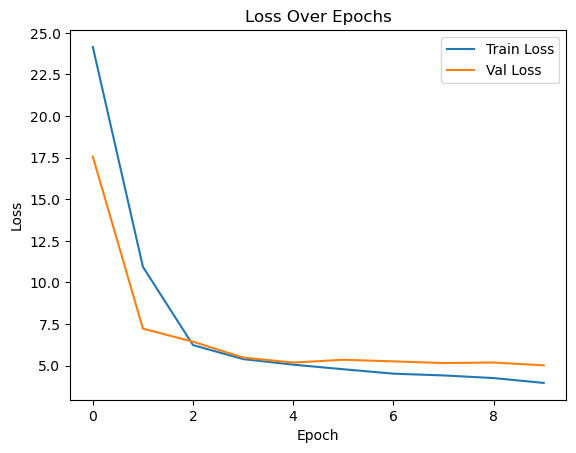

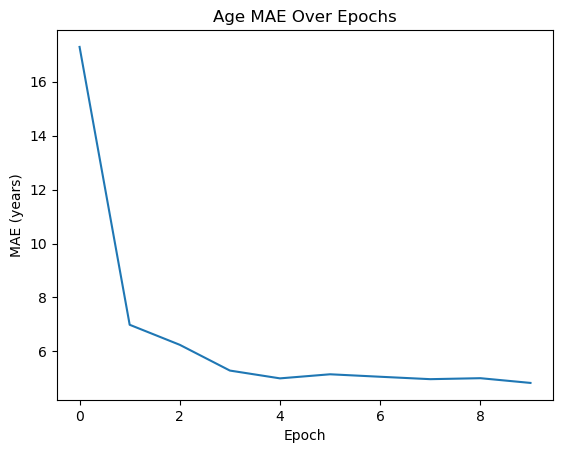

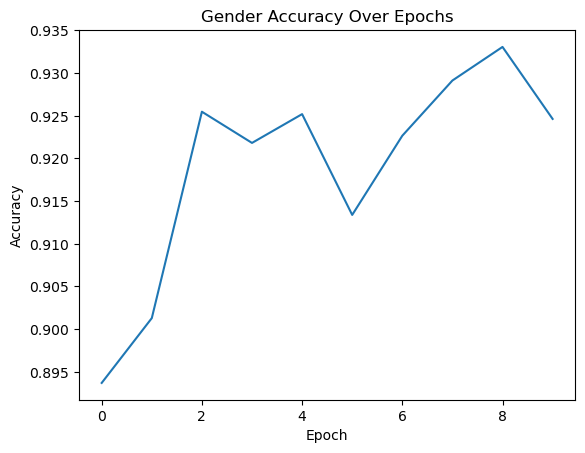

In [73]:
plt.figure()
plt.plot(history["train_loss"], label="Train Loss")
plt.plot(history["val_loss"], label="Val Loss")
plt.legend()
plt.title("Loss Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()

plt.figure()
plt.plot(history["val_age_mae"], label="Val Age MAE")
plt.title("Age MAE Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("MAE (years)")
plt.show()

plt.figure()
plt.plot(history["val_gender_acc"], label="Val Gender Acc")
plt.title("Gender Accuracy Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.show()

We observe an elbow in loss at epoch 2 (quite early). Age MAE plateaus around 2, also relatively soon in the training. However, gender continues to improve as we train more epochs.

In [74]:
def get_test_predictions(model, loader, device):
    model.eval()

    results = []

    with torch.no_grad():
        for images, ages, genders, races, age_bins in loader:
            images = images.to(device)

            age_pred, gender_logit = model(images)
            gender_prob = torch.sigmoid(gender_logit)
            gender_pred = (gender_prob >= 0.5).float()

            for i in range(len(images)):
                results.append({
                    "true_age": ages[i].item(),
                    "pred_age": age_pred[i].item(),
                    "age_error": age_pred[i].item() - ages[i].item(),
                    "true_gender": int(genders[i].item()),
                    "pred_gender": int(gender_pred[i].item()),
                    "gender_correct": int(gender_pred[i].item() == genders[i].item()),
                    "race_label": races[i],
                    "eval_age_bin": str(age_bins[i])
                })

    return pd.DataFrame(results)

In [75]:
test_results = get_test_predictions(resnet_model, test_loader, device)

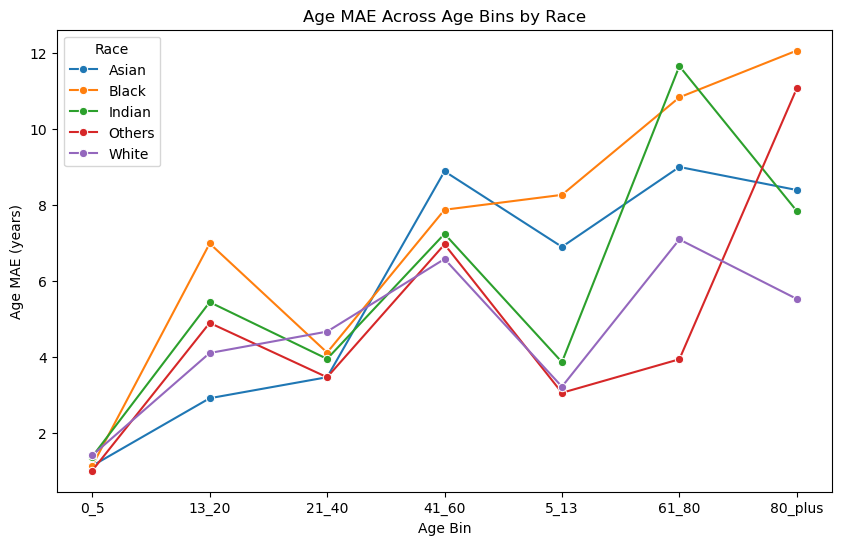

In [76]:
age_mae_by_group = (
    test_results
    .groupby(["eval_age_bin", "race_label"])["age_error"]
    .apply(lambda x: x.abs().mean())
    .reset_index(name="age_mae")
)

plt.figure(figsize=(10, 6))
sns.lineplot(
    data=age_mae_by_group,
    x="eval_age_bin",
    y="age_mae",
    hue="race_label",
    marker="o"
)
plt.title("Age MAE Across Age Bins by Race")
plt.xlabel("Age Bin")
plt.ylabel("Age MAE (years)")
plt.legend(title="Race")
plt.show()

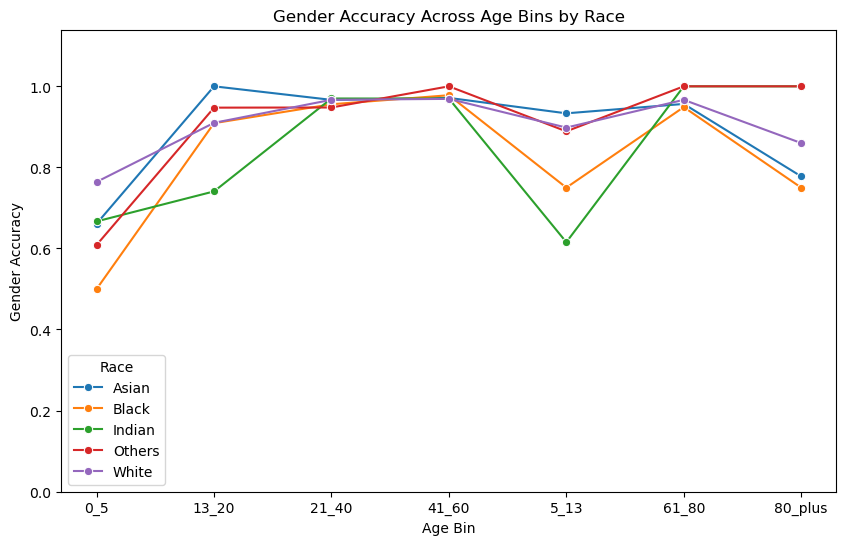

In [77]:
gender_acc_by_group = (
    test_results
    .groupby(["eval_age_bin", "race_label"])["gender_correct"]
    .mean()
    .reset_index(name="gender_accuracy")
)

plt.figure(figsize=(10, 6))
sns.lineplot(
    data=gender_acc_by_group,
    x="eval_age_bin",
    y="gender_accuracy",
    hue="race_label",
    marker="o"
)
plt.title("Gender Accuracy Across Age Bins by Race")
plt.xlabel("Age Bin")
plt.ylabel("Gender Accuracy")
plt.ylim(0, 1.14)
plt.legend(title="Race")
plt.show()

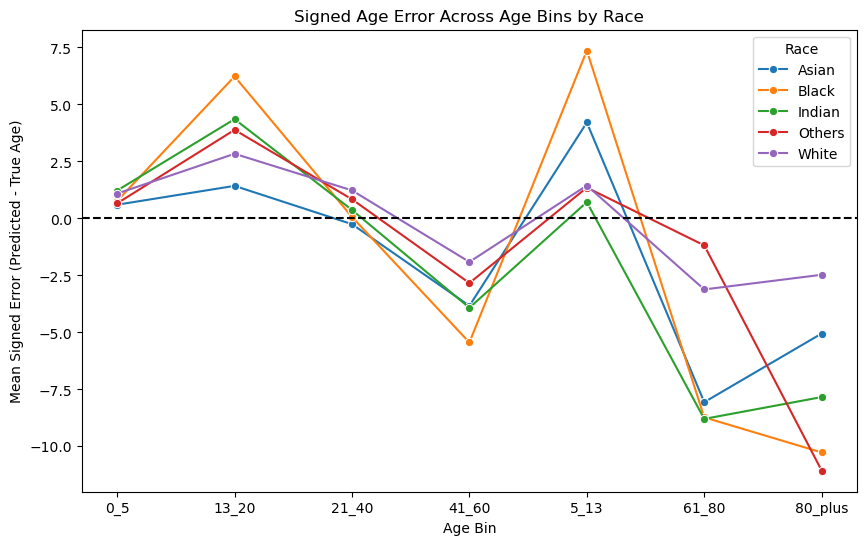

In [78]:
signed_error_by_group = (
    test_results
    .groupby(["eval_age_bin", "race_label"])["age_error"]
    .mean()
    .reset_index(name="mean_signed_error")
)

plt.figure(figsize=(10, 6))

sns.lineplot(
    data=signed_error_by_group,
    x="eval_age_bin",
    y="mean_signed_error",
    hue="race_label",
    marker="o"
)

plt.axhline(0, linestyle="--", color="black")
plt.title("Signed Age Error Across Age Bins by Race")
plt.xlabel("Age Bin")
plt.ylabel("Mean Signed Error (Predicted - True Age)")
plt.legend(title="Race")

plt.show()

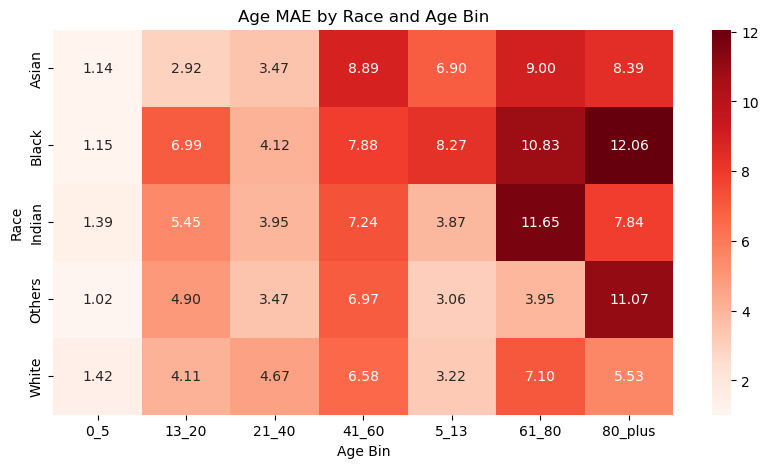

In [79]:
age_mae_pivot = age_mae_by_group.pivot(
    index="race_label",
    columns="eval_age_bin",
    values="age_mae"
)

plt.figure(figsize=(10, 5))
sns.heatmap(age_mae_pivot, annot=True, fmt=".2f", cmap="Reds")
plt.title("Age MAE by Race and Age Bin")
plt.xlabel("Age Bin")
plt.ylabel("Race")
plt.show()

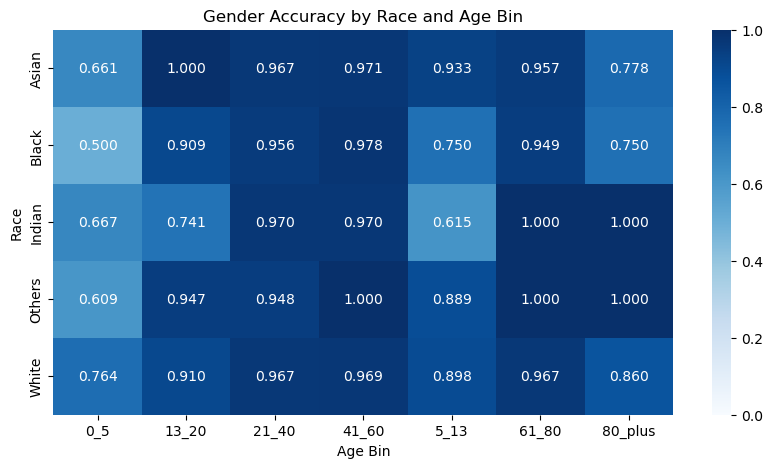

In [80]:
gender_acc_pivot = gender_acc_by_group.pivot(
    index="race_label",
    columns="eval_age_bin",
    values="gender_accuracy"
)

plt.figure(figsize=(10, 5))
sns.heatmap(gender_acc_pivot, annot=True, fmt=".3f", cmap="Blues", vmin=0, vmax=1)
plt.title("Gender Accuracy by Race and Age Bin")
plt.xlabel("Age Bin")
plt.ylabel("Race")
plt.show()

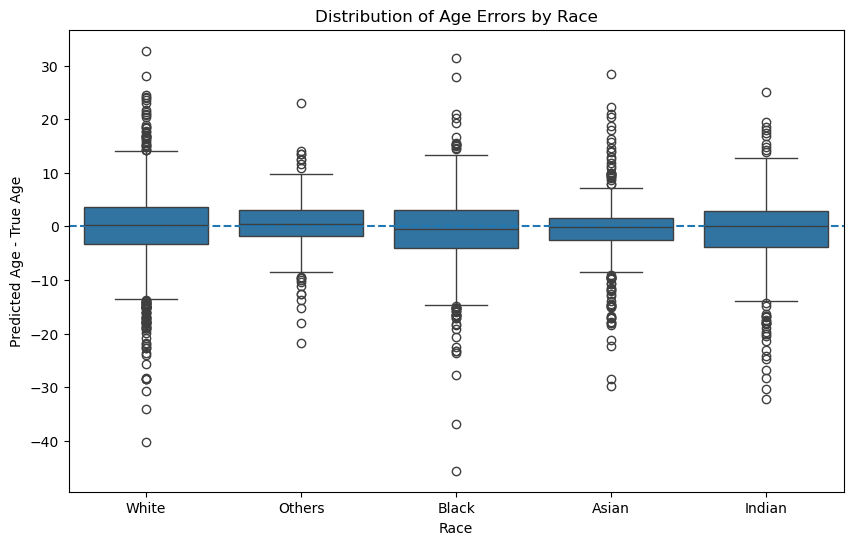

In [81]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=test_results, x="race_label", y="age_error")
plt.axhline(0, linestyle="--")
plt.title("Distribution of Age Errors by Race")
plt.xlabel("Race")
plt.ylabel("Predicted Age - True Age")
plt.show()

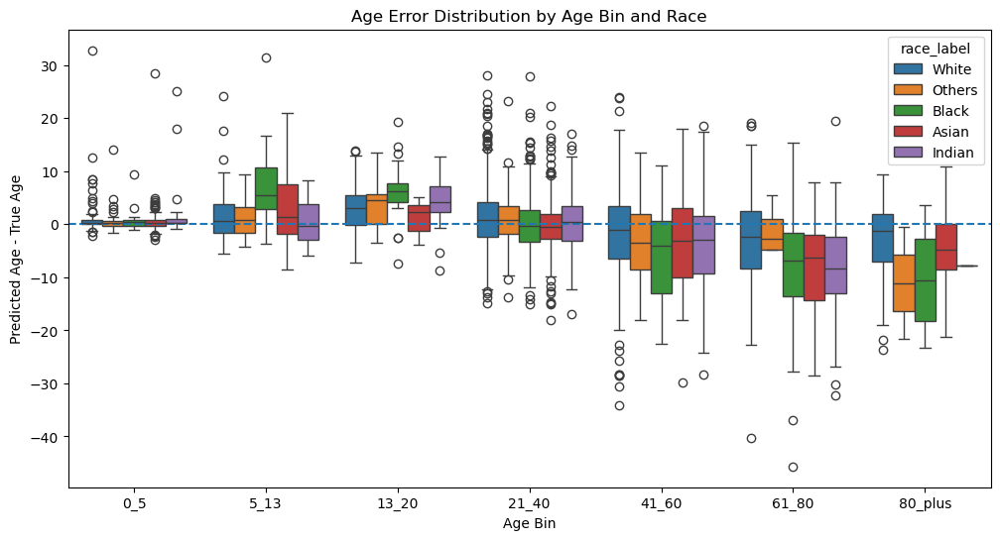

In [82]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=test_results, 
            x="eval_age_bin", 
            y="age_error", 
            hue="race_label", 
            order=labels)
plt.axhline(0, linestyle="--")
plt.title("Age Error Distribution by Age Bin and Race")
plt.xlabel("Age Bin")
plt.ylabel("Predicted Age - True Age")
plt.show()

- As age increases, MAE increases.
- Age MAE between races grows in a similar pattern with all of the major race groups and is much more sporadic for the "other" category.
- The model tends to predict younger for all categories above 20.

First Pass EfficientNet CNN

In [83]:
class MultiTaskEfficientNet(nn.Module):
    def __init__(self):
        super().__init__()

        self.backbone = models.efficientnet_b0(
            weights=models.EfficientNet_B0_Weights.DEFAULT
        )

        in_features = self.backbone.classifier[1].in_features
        self.backbone.classifier = nn.Identity()

        self.age_head = nn.Sequential(
            nn.Linear(in_features, 128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, 1)
        )

        self.gender_head = nn.Sequential(
            nn.Linear(in_features, 128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, 1)
        )

    def forward(self, x):
        features = self.backbone(x)
        age_pred = self.age_head(features).squeeze(1)
        gender_logit = self.gender_head(features).squeeze(1)
        return age_pred, gender_logit

In [84]:
best_val_mae = float("inf")
best_gender_acc = 0

effnet_model = MultiTaskEfficientNet().to(device)
optimizer = torch.optim.Adam(effnet_model.parameters(), lr=1e-4)


num_epochs = 10

history = {
    "train_loss": [],
    "val_loss": [],
    "val_age_mae": [],
    "val_gender_acc": []
}

best_val_mae = float("inf")
best_gender_acc = 0

start_time = time.time()

for epoch in range(num_epochs):
    train_metrics = train_one_epoch(
        effnet_model, train_loader, optimizer,
        age_criterion, gender_criterion, device
    )

    val_metrics = evaluate(
        effnet_model, val_loader,
        age_criterion, gender_criterion, device
    )

    history["train_loss"].append(train_metrics["loss"])
    history["val_loss"].append(val_metrics["loss"])
    history["val_age_mae"].append(val_metrics["age_mae"])
    history["val_gender_acc"].append(val_metrics["gender_acc"])

    print(f"Epoch {epoch+1:02d} | "
          f"Train Loss: {train_metrics['loss']:.4f} | "
          f"Val Loss: {val_metrics['loss']:.4f} | "
          f"Age MAE: {val_metrics['age_mae']:.2f} | "
          f"Gender Acc: {val_metrics['gender_acc']:.3f}")

    if (
        val_metrics["age_mae"] < best_val_mae or
        (
            abs(val_metrics["age_mae"] - best_val_mae) < 1e-4 and
            val_metrics["gender_acc"] > best_gender_acc
        )
    ):
        best_val_mae = val_metrics["age_mae"]
        best_gender_acc = val_metrics["gender_acc"]
        torch.save(effnet_model.state_dict(), "best_efficientnet.pt")
        print("  → Saved new best model")

end_time = time.time()

total_time = end_time - start_time
print(f"\nTotal training time: {total_time:.2f} seconds ({total_time/60:.2f} minutes)")

Epoch 01 | Train Loss: 15.3910 | Val Loss: 7.1020 | Age MAE: 6.77 | Gender Acc: 0.853
  → Saved new best model
Epoch 02 | Train Loss: 7.3747 | Val Loss: 6.3521 | Age MAE: 6.08 | Gender Acc: 0.875
  → Saved new best model
Epoch 03 | Train Loss: 6.6709 | Val Loss: 6.0863 | Age MAE: 5.82 | Gender Acc: 0.879
  → Saved new best model
Epoch 04 | Train Loss: 6.1974 | Val Loss: 5.8672 | Age MAE: 5.62 | Gender Acc: 0.889
  → Saved new best model
Epoch 05 | Train Loss: 5.7748 | Val Loss: 5.6482 | Age MAE: 5.42 | Gender Acc: 0.897
  → Saved new best model
Epoch 06 | Train Loss: 5.5154 | Val Loss: 5.6000 | Age MAE: 5.37 | Gender Acc: 0.901
  → Saved new best model
Epoch 07 | Train Loss: 5.3174 | Val Loss: 5.9174 | Age MAE: 5.71 | Gender Acc: 0.908
Epoch 08 | Train Loss: 5.0965 | Val Loss: 5.3928 | Age MAE: 5.18 | Gender Acc: 0.905
  → Saved new best model
Epoch 09 | Train Loss: 4.9476 | Val Loss: 5.5712 | Age MAE: 5.37 | Gender Acc: 0.915
Epoch 10 | Train Loss: 4.7406 | Val Loss: 5.8542 | Age MAE:

Compare against ResNet.

In [85]:
resnet_test_results = get_test_predictions(resnet_model, test_loader, device)
effnet_test_results = get_test_predictions(effnet_model, test_loader, device)

resnet_test_results["model"] = "ResNet18"
effnet_test_results["model"] = "EfficientNet-B0"

all_results = pd.concat(
    [resnet_test_results, effnet_test_results],
    ignore_index=True
)

age_order = ["0_5", "5_13", "13_20", "21_40", "41_60", "61_80", "80_plus"]

all_results["eval_age_bin"] = pd.Categorical(
    all_results["eval_age_bin"],
    categories=age_order,
    ordered=True
)

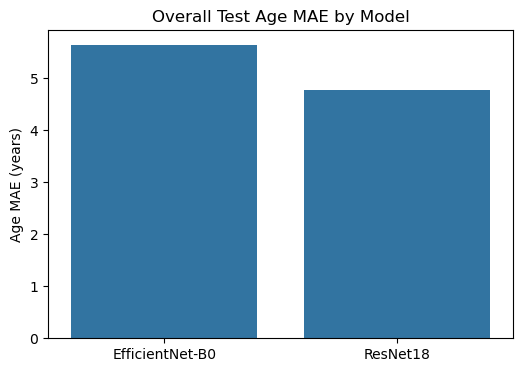

In [86]:
overall_age = (
    all_results.groupby("model")["age_error"]
    .apply(lambda x: x.abs().mean())
    .reset_index(name="age_mae")
)

plt.figure(figsize=(6, 4))
sns.barplot(data=overall_age, x="model", y="age_mae")
plt.title("Overall Test Age MAE by Model")
plt.ylabel("Age MAE (years)")
plt.xlabel("")
plt.show()

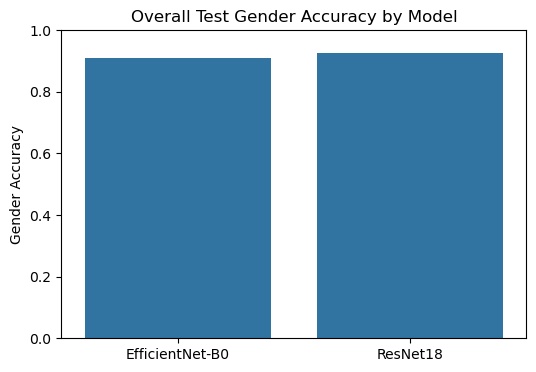

In [87]:
overall_gender = (
    all_results.groupby("model")["gender_correct"]
    .mean()
    .reset_index(name="gender_acc")
)

plt.figure(figsize=(6, 4))
sns.barplot(data=overall_gender, x="model", y="gender_acc")
plt.title("Overall Test Gender Accuracy by Model")
plt.ylabel("Gender Accuracy")
plt.xlabel("")
plt.ylim(0, 1)
plt.show()

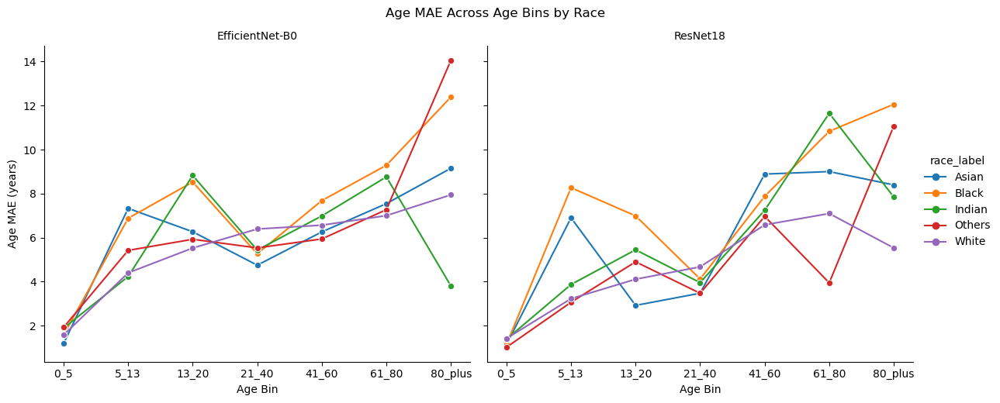

In [88]:
age_mae_plot = (
    all_results.groupby(["model", "eval_age_bin", "race_label"])["age_error"]
    .apply(lambda x: x.abs().mean())
    .reset_index(name="age_mae")
)

g = sns.relplot(
    data=age_mae_plot,
    x="eval_age_bin",
    y="age_mae",
    hue="race_label",
    col="model",
    kind="line",
    marker="o",
    height=5,
    aspect=1.2
)

g.set_axis_labels("Age Bin", "Age MAE (years)")
g.set_titles("{col_name}")
g.fig.suptitle("Age MAE Across Age Bins by Race", y=1.03)
plt.show()

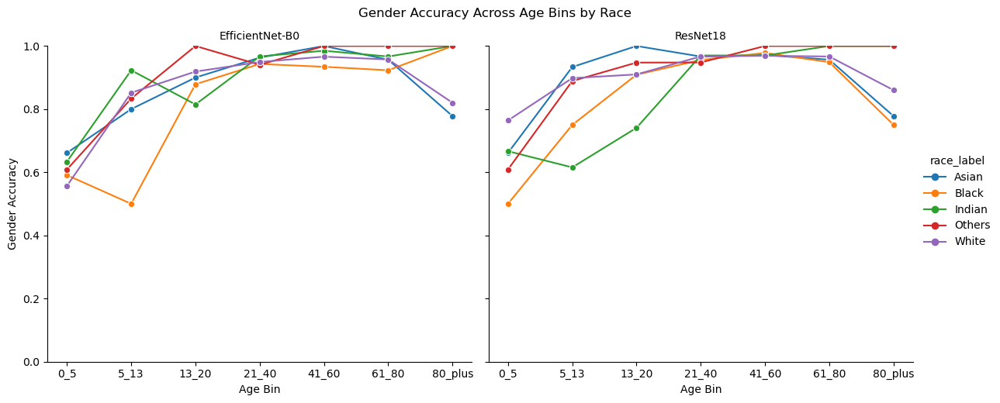

In [89]:
gender_acc_plot = (
    all_results.groupby(["model", "eval_age_bin", "race_label"])["gender_correct"]
    .mean()
    .reset_index(name="gender_acc")
)

g = sns.relplot(
    data=gender_acc_plot,
    x="eval_age_bin",
    y="gender_acc",
    hue="race_label",
    col="model",
    kind="line",
    marker="o",
    height=5,
    aspect=1.2
)

g.set_axis_labels("Age Bin", "Gender Accuracy")
g.set_titles("{col_name}")
g.set(ylim=(0, 1))
g.fig.suptitle("Gender Accuracy Across Age Bins by Race", y=1.03)
plt.show()

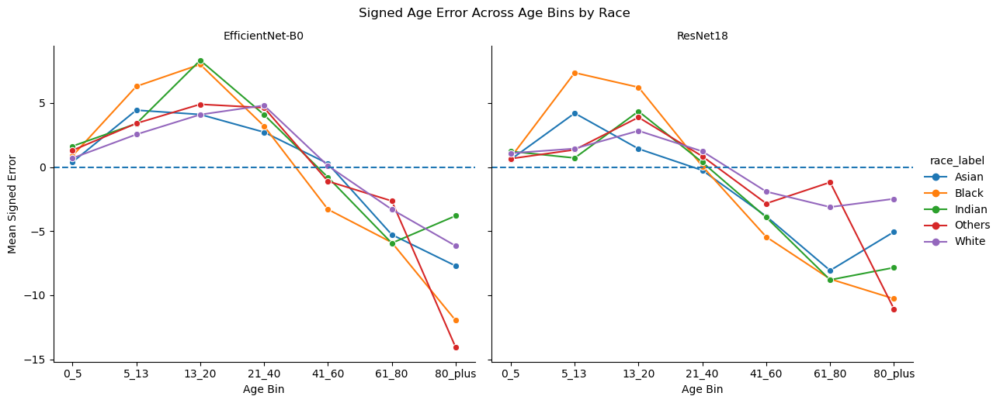

In [90]:
signed_error_plot = (
    all_results.groupby(["model", "eval_age_bin", "race_label"])["age_error"]
    .mean()
    .reset_index(name="signed_error")
)

g = sns.relplot(
    data=signed_error_plot,
    x="eval_age_bin",
    y="signed_error",
    hue="race_label",
    col="model",
    kind="line",
    marker="o",
    height=5,
    aspect=1.2
)

for ax in g.axes.flat:
    ax.axhline(0, linestyle="--")

g.set_axis_labels("Age Bin", "Mean Signed Error")
g.set_titles("{col_name}")
g.fig.suptitle("Signed Age Error Across Age Bins by Race", y=1.03)
plt.show()

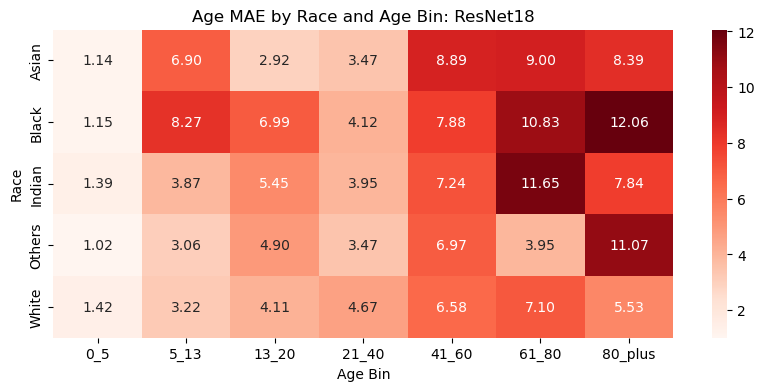

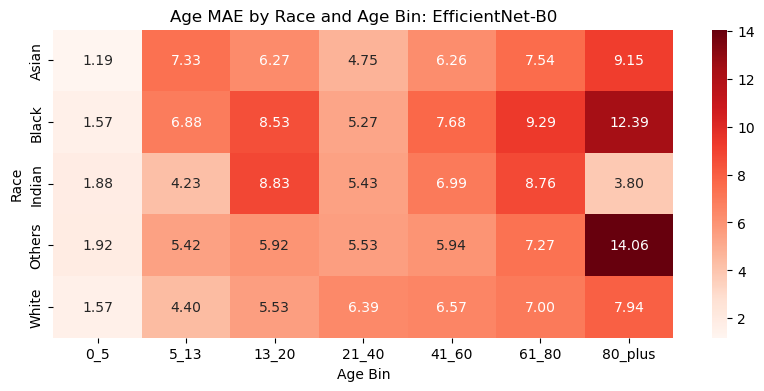

In [91]:
for model_name in all_results["model"].unique():
    temp = all_results[all_results["model"] == model_name]

    heat = (
        temp.groupby(["race_label", "eval_age_bin"])["age_error"]
        .apply(lambda x: x.abs().mean())
        .reset_index(name="age_mae")
        .pivot(index="race_label", columns="eval_age_bin", values="age_mae")
    )

    plt.figure(figsize=(10, 4))
    sns.heatmap(heat, annot=True, fmt=".2f", cmap="Reds")
    plt.title(f"Age MAE by Race and Age Bin: {model_name}")
    plt.xlabel("Age Bin")
    plt.ylabel("Race")
    plt.show()

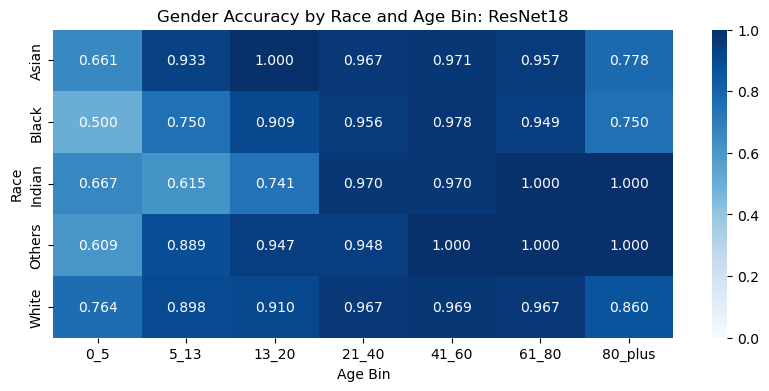

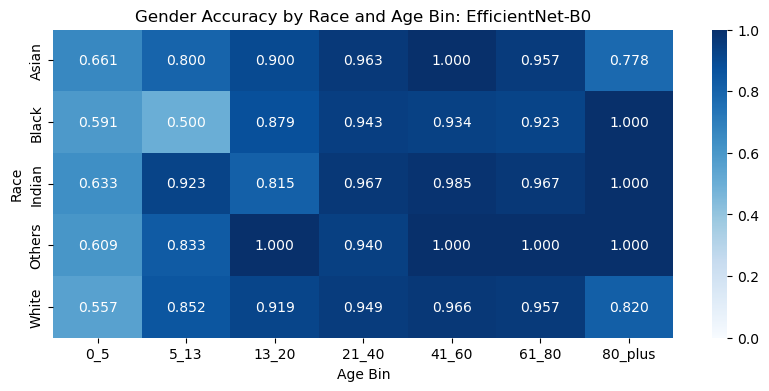

In [92]:
for model_name in all_results["model"].unique():
    temp = all_results[all_results["model"] == model_name]

    heat = (
        temp.groupby(["race_label", "eval_age_bin"])["gender_correct"]
        .mean()
        .reset_index(name="gender_acc")
        .pivot(index="race_label", columns="eval_age_bin", values="gender_acc")
    )

    plt.figure(figsize=(10, 4))
    sns.heatmap(heat, annot=True, fmt=".3f", cmap="Blues", vmin=0, vmax=1)
    plt.title(f"Gender Accuracy by Race and Age Bin: {model_name}")
    plt.xlabel("Age Bin")
    plt.ylabel("Race")
    plt.show()